# Model debugging

Not a very nice notebook digging into the model behaviour.

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np

from predictors import get_indicators

/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_57128/694076773.py:2: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
import contextily 
import palettable.matplotlib as palmpl
import matplotlib.pyplot as plt
import matplotlib.cm
import mapclassify
import husl
import seaborn as sns

from utils import legendgram

In [47]:
df = pd.read_parquet("data/empty.parquet")
df.head()

,signature_type,use,greenspace,job_types
geo_code,,,,
E00042786,None,None,None,None
E00042707,None,None,None,None
E00042703,None,None,None,None
E00042782,None,None,None,None
E00042789,None,None,None,None


In [4]:
data_folder = "/Users/martin/Library/CloudStorage/OneDrive-SharedLibraries-TheAlanTuringInstitute/Daniel Arribas-Bel - demoland_data"

In [5]:
geom = gpd.read_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

In [6]:
oa_key = pd.read_parquet(f"{data_folder}/sampling/oa_key.parquet")

In [7]:
oa_key

,primary_type
OA11CD,
E00041363,Dense urban neighbourhoods
E00041364,Local urbanity
E00041366,Dense residential neighbourhoods
E00041367,Dense residential neighbourhoods
E00041368,Dense residential neighbourhoods
...,...
E00175601,Dense residential neighbourhoods
E00175602,Dense residential neighbourhoods
E00175603,Dense residential neighbourhoods


In [8]:
loc_urb = oa_key[oa_key.primary_type == "Local urbanity"]
dense_nei = oa_key[oa_key.primary_type == "Dense urban neighbourhoods"]
dense_res = oa_key[oa_key.primary_type == "Dense residential neighbourhoods"]

In [48]:
df.loc[loc_urb.index, "signature_type"] = 12
df.loc[dense_nei.index, "signature_type"] = 11
df.loc[dense_res.index, "signature_type"] = 10

In [10]:
df

,signature_type,use,greenspace,job_types
geo_code,,,,
E00042786,None,None,None,None
E00042707,11,None,None,None
E00042703,None,None,None,None
E00042782,None,None,None,None
E00042789,None,None,None,None
...,...,...,...,...
E00041811,None,None,None,None
E00041818,None,None,None,None
E00041898,None,None,None,None


In [11]:
default = get_indicators(pd.read_parquet("data/empty.parquet"))

In [49]:
changed = get_indicators(df)

In [14]:
from shapely.geometry import box

bds = geom.total_bounds
extent = gpd.GeoSeries([box((bds[0] - 7000), bds[1], bds[2] + 7000, bds[3])], crs=geom.crs).to_crs(3857)

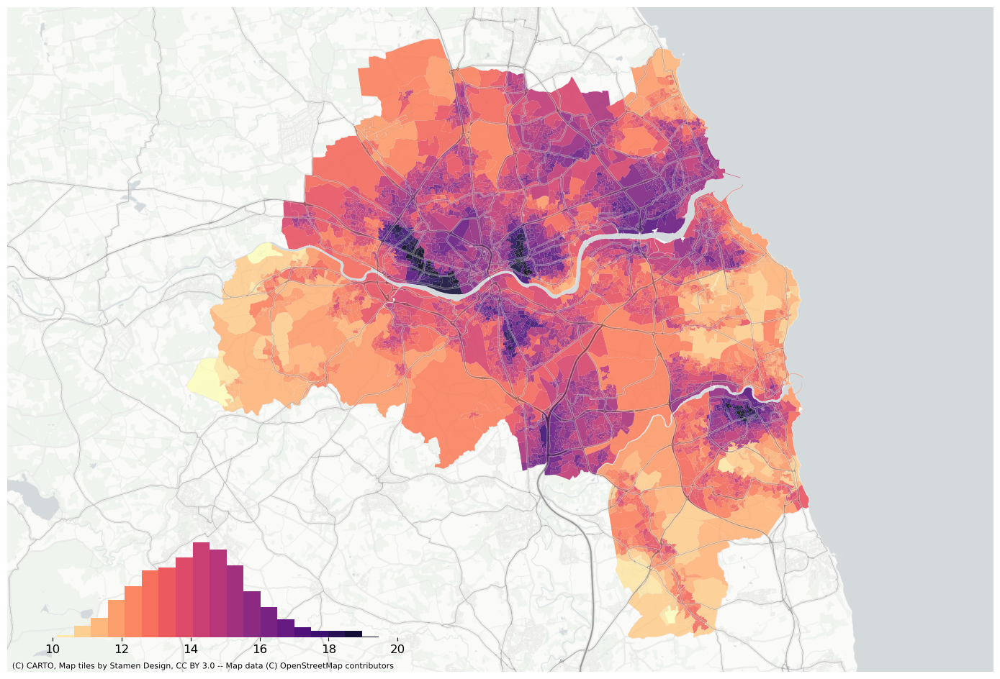

In [15]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(geom['air_quality_index'].values, k=20).bins

legendgram(
    f,
    ax,
    default.air_quality.values,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (10,20), # clip the displayed range of the histogram
)

geom.assign(pred=default.air_quality.values).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="magma_r")
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")


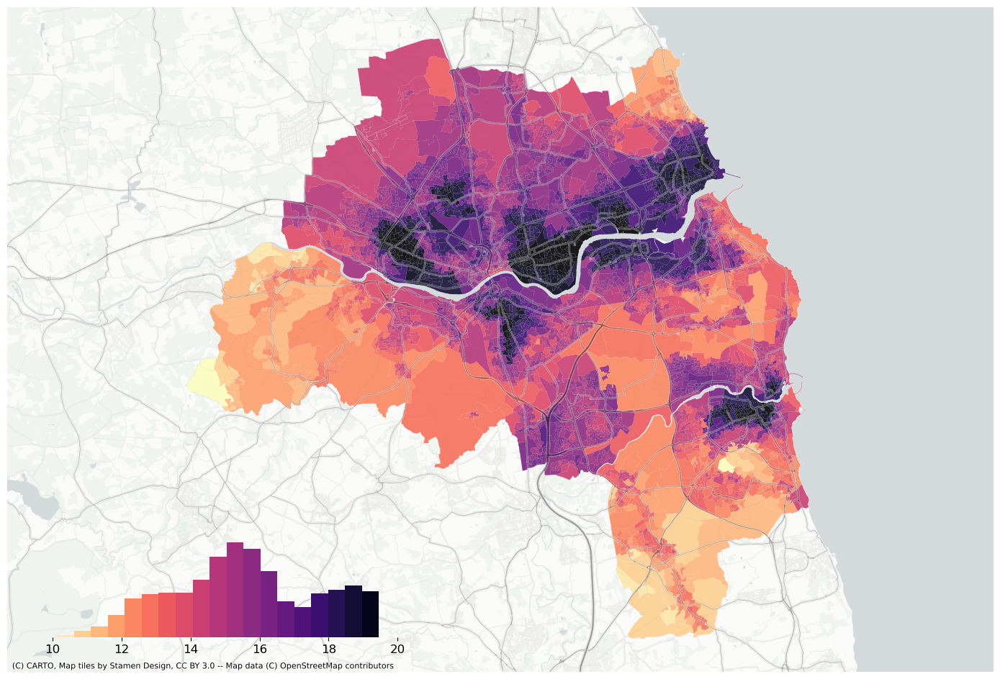

In [40]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(geom['air_quality_index'].values, k=20).bins

legendgram(
    f,
    ax,
    changed.air_quality.values,
    bins,
    pal=palmpl.Magma_20_r,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (10,20), # clip the displayed range of the histogram
)

geom.assign(pred=changed.air_quality.values).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="magma_r")
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")


<AxesSubplot: >

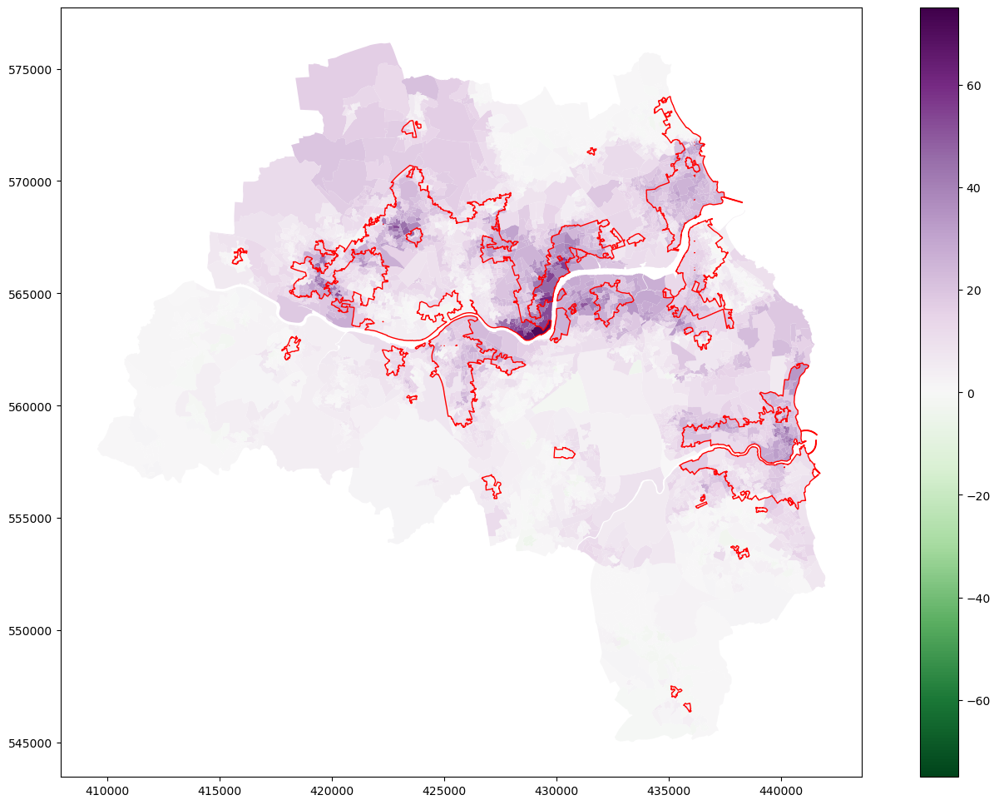

In [41]:
ax = geom.plot((changed.air_quality.values - default.air_quality.values) / default.air_quality.values * 100, legend=True, cmap="PRGn_r", vmin=-75, vmax=75, figsize=(18, 12))
geom[geom.geo_code.isin(dense_res.index.append(dense_nei.index).append(loc_urb.index))].dissolve().boundary.plot(ax=ax, color="red", linewidth=1)

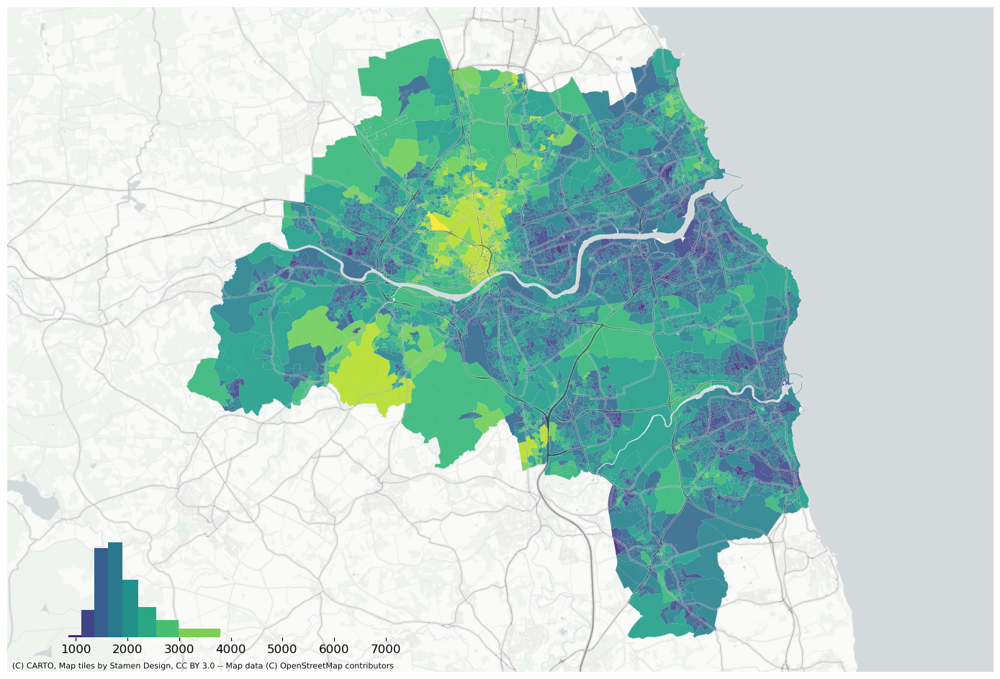

In [45]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.NaturalBreaks(geom["house_price_index"].dropna().values, k=10).bins

legendgram(
    f,
    ax,
    np.exp(default.house_price.values),
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    # clip = (10,20), # clip the displayed range of the histogram
)

geom.assign(pred=np.exp(default.house_price.values)).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")


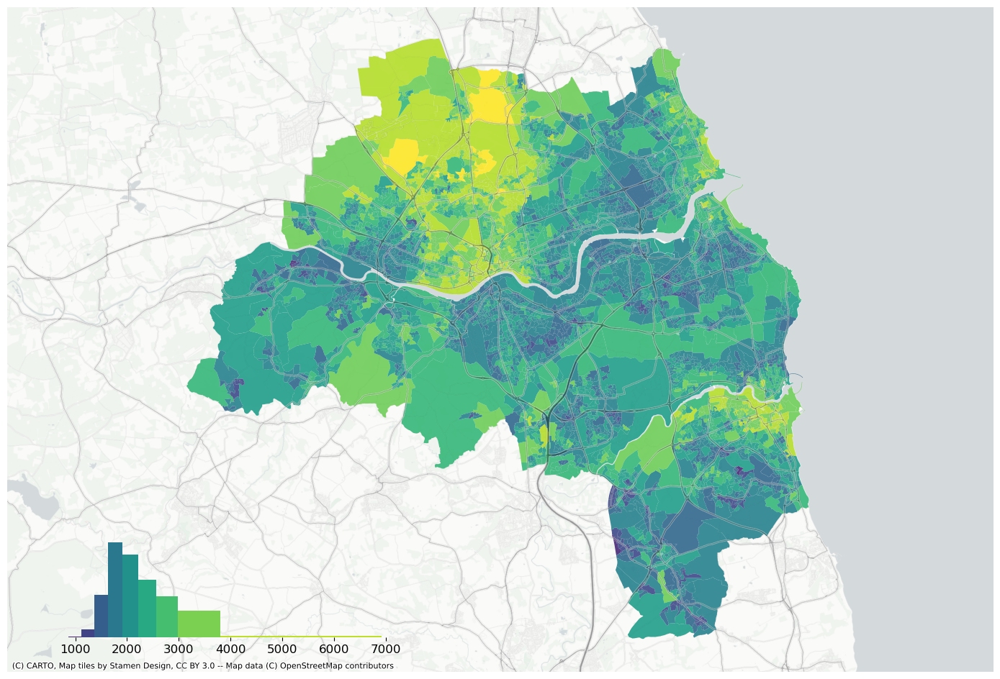

In [50]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.NaturalBreaks(geom["house_price_index"].dropna().values, k=10).bins

legendgram(
    f,
    ax,
    np.exp(changed.house_price.values),
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    # clip = (10,20), # clip the displayed range of the histogram
)

geom.assign(pred=np.exp(changed.house_price.values)).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")


<AxesSubplot: >

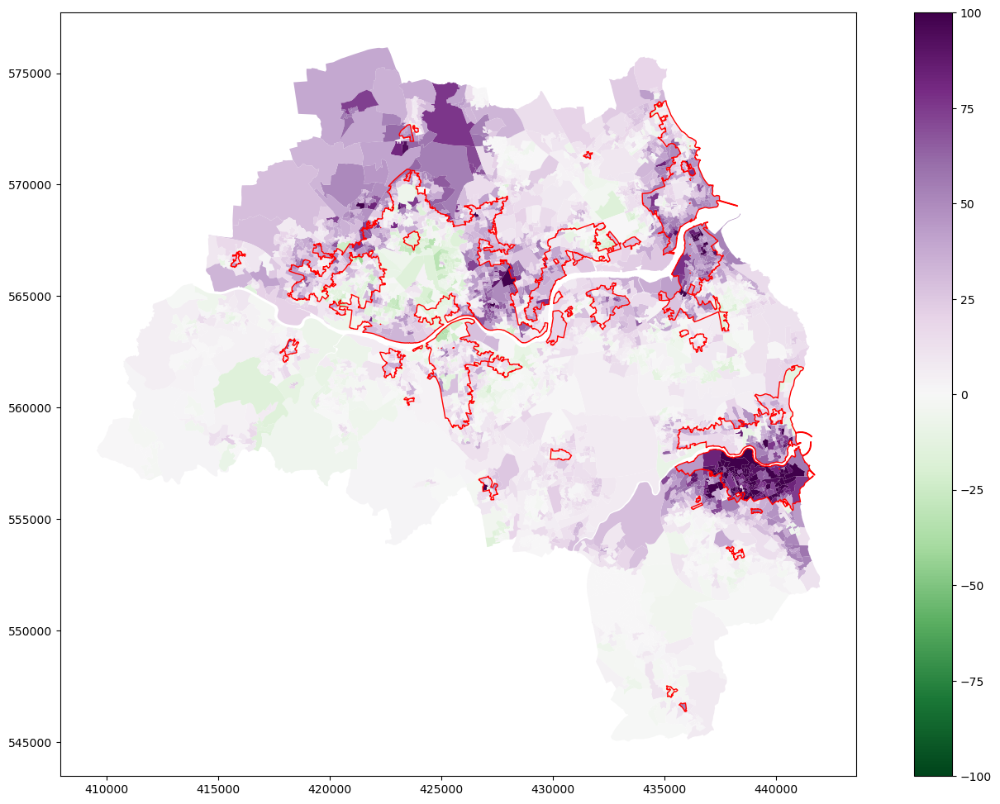

In [54]:
ax = geom.plot((np.exp(changed.house_price.values) - np.exp(default.house_price.values)) / np.exp(default.house_price.values) * 100, legend=True, cmap="PRGn_r", vmin=-100, vmax=100, figsize=(18, 12))
geom[geom.geo_code.isin(dense_res.index.append(dense_nei.index).append(loc_urb.index))].dissolve().boundary.plot(ax=ax, color="red", linewidth=1)

<AxesSubplot: >

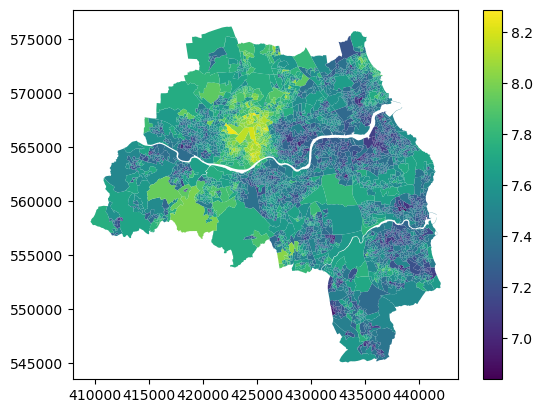

In [27]:
geom.plot(default.house_price.values, legend=True)

<AxesSubplot: >

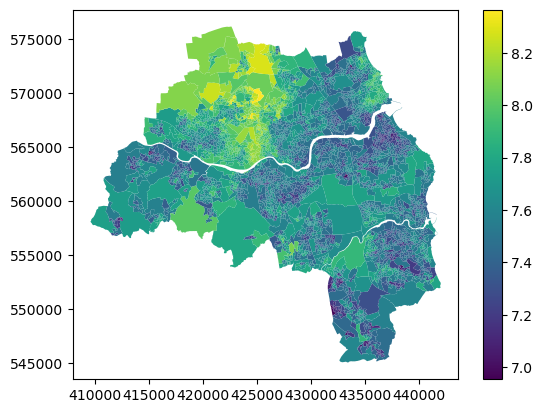

In [44]:
geom.plot(changed.house_price.values, legend=True)

<AxesSubplot: >

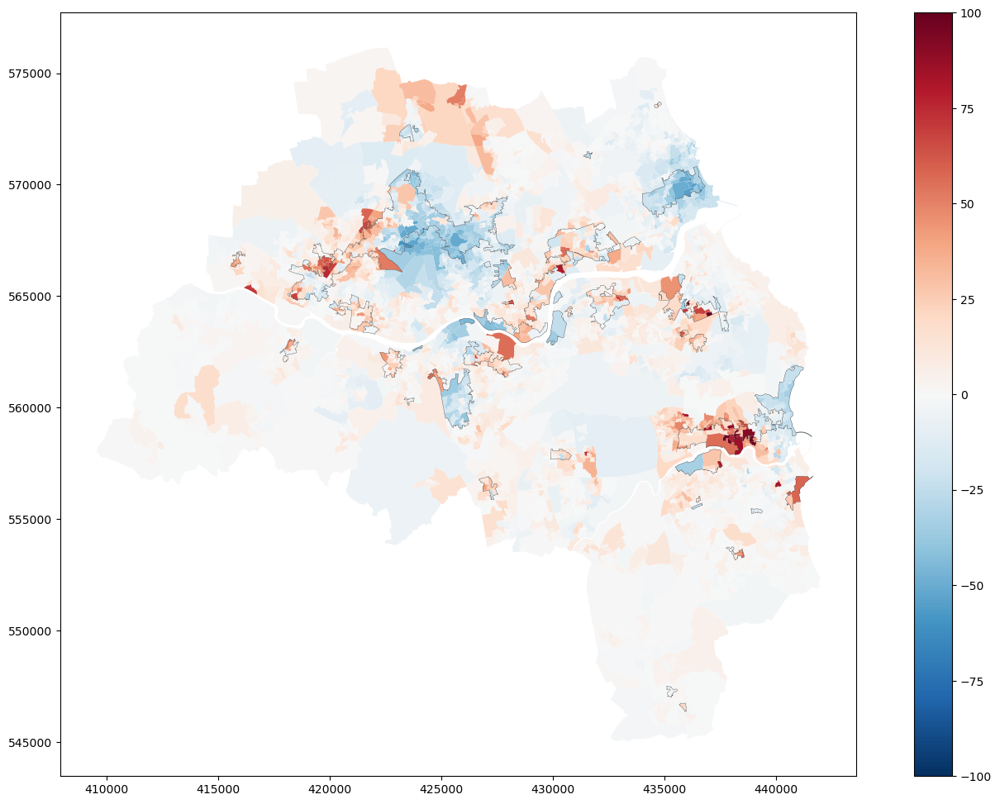

In [57]:
ax = geom.plot((changed.house_price.values - default.house_price.values) / default.house_price.values * 100, legend=True, cmap="RdBu_r", vmin=-100, vmax=100, figsize=(18, 12))
geom[geom.geo_code.isin(dense_res.index)].dissolve().boundary.plot(ax=ax, color="black", linewidth=.2)

In [58]:
changed2 = get_indicators(df)

<AxesSubplot: >

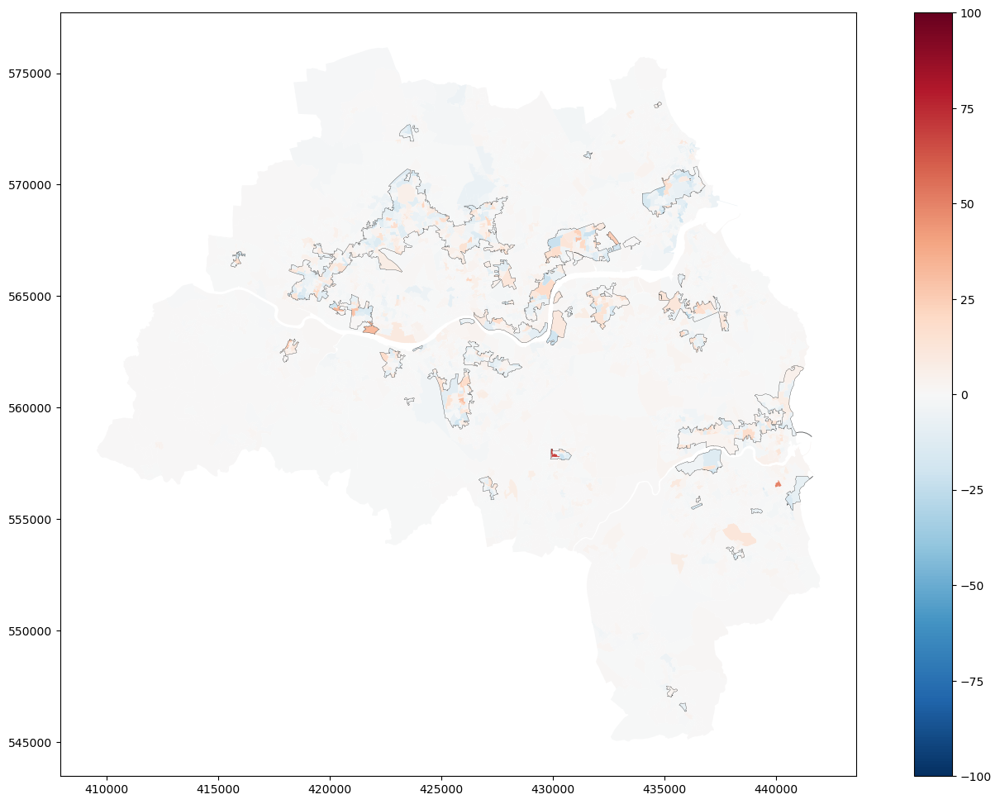

In [59]:
ax = geom.plot((changed.house_price.values - changed2.house_price.values) / changed2.house_price.values * 100, legend=True, cmap="RdBu_r", vmin=-100, vmax=100, figsize=(18, 12))
geom[geom.geo_code.isin(dense_res.index)].dissolve().boundary.plot(ax=ax, color="black", linewidth=.2)

In [67]:
import pickle
import libpysal

In [73]:
with open("data/air_quality_predictor.pickle", "rb") as f:
    air_quality_predictor = pickle.load(f)

with open("data/house_price_predictor.pickle", "rb") as f:
    house_price_predictor = pickle.load(f)

In [63]:
air_quality_predictor.model.

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

In [64]:
data = gpd.read_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

Filter only explanatory variables.

In [65]:
exvars = data.drop(columns=["geo_code", "geometry", "air_quality_index", "house_price_index", "jobs_accessibility_index", "greenspace_accessibility_index"])

In [68]:
queen = libpysal.weights.Queen.from_dataframe(data)
weights = {
    "queen": queen,
    "2000m": libpysal.weights.DistanceBand.from_dataframe(data, 2000),
}
combined_weigts = {
    # "queen500m": libpysal.weights.w_union(weights["queen"], weights["500m"]),
    # "queen1000m": libpysal.weights.w_union(weights["queen"], weights["1000m"]),
    "queen2000m": libpysal.weights.w_union(weights["queen"], weights["2000m"]),
}

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [69]:
W = combined_weigts["queen2000m"]
W.transform = "r"
for col in exvars.columns.copy():
    exvars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
    W, exvars[col]
)

In [70]:
from sklearn.inspection import permutation_importance

imp = permutation_importance(
    air_quality_predictor.model,
    exvars,
    data.air_quality_index,
    n_repeats=30,
    random_state=0,
)
feature_importance = pd.Series(
    imp["importances_mean"],
    index=exvars.columns,
    name="permutation_importance",
).sort_values(ascending=False)

In [72]:
feature_importance.head(40)

Land cover [Non-irrigated arable land]_lag                                            0.275721
sdsAre_lag                                                                            0.220656
lieWCe_lag                                                                            0.057164
ssbERI_lag                                                                            0.023500
ldsMSL_lag                                                                            0.013724
C. Manufacturing_lag                                                                  0.013285
stbOri_lag                                                                            0.013072
H, J. Transport and communication_lag                                                 0.012588
sscCCo_lag                                                                            0.011505
Land cover [Industrial or commercial units]_lag                                       0.009587
linWID_lag                                        

In [109]:
from sklearn.inspection import PartialDependenceDisplay

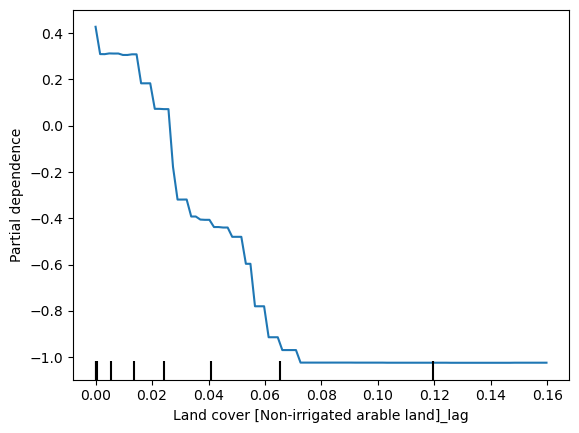

In [112]:
PartialDependenceDisplay.from_estimator(air_quality_predictor.model, exvars, ["Land cover [Non-irrigated arable land]_lag"])

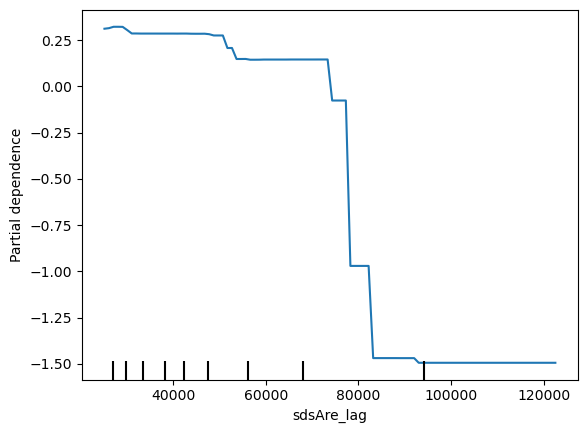

In [113]:
PartialDependenceDisplay.from_estimator(air_quality_predictor.model, exvars, ["sdsAre_lag"])

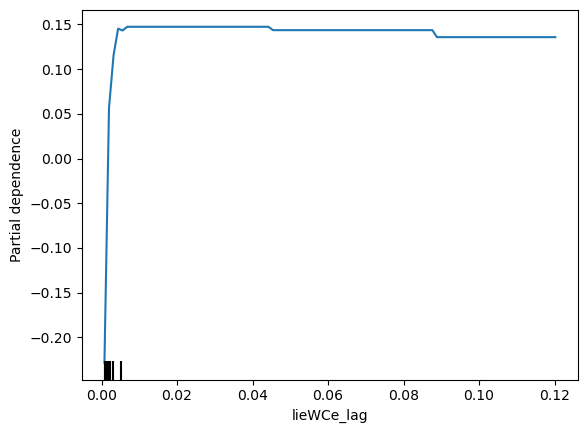

In [114]:
PartialDependenceDisplay.from_estimator(air_quality_predictor.model, exvars, ["lieWCe_lag"])

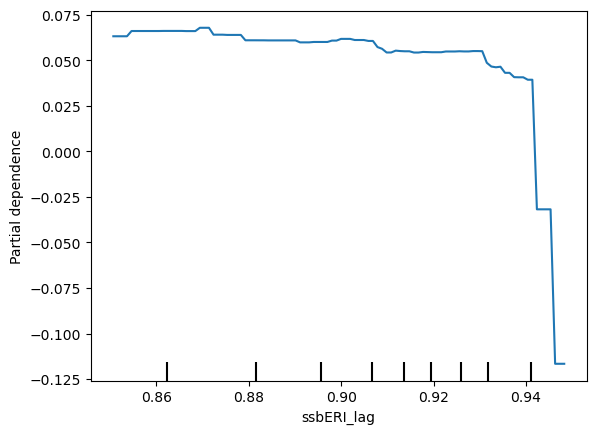

In [115]:
PartialDependenceDisplay.from_estimator(air_quality_predictor.model, exvars, ["ssbERI_lag"])

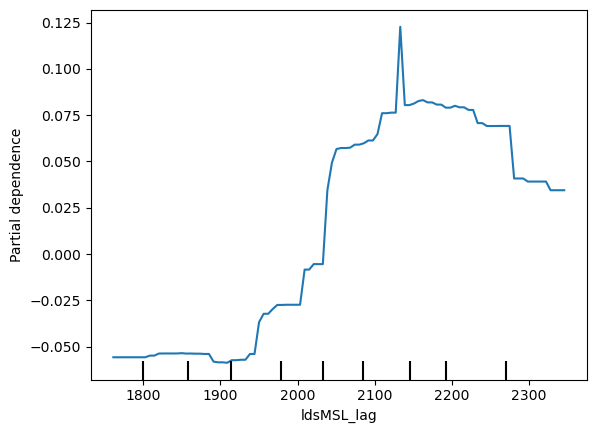

In [116]:
PartialDependenceDisplay.from_estimator(air_quality_predictor.model, exvars, ["ldsMSL_lag"])

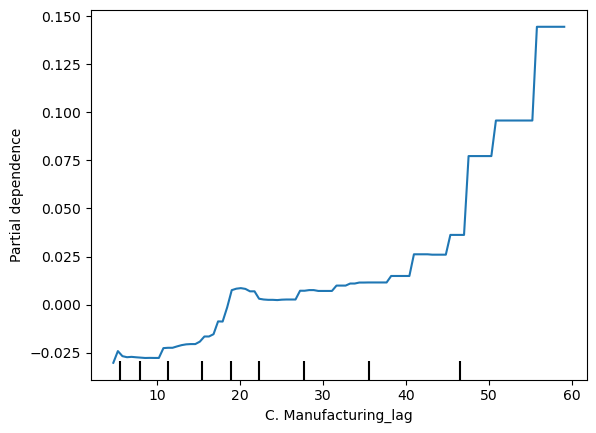

In [117]:
PartialDependenceDisplay.from_estimator(air_quality_predictor.model, exvars, ["C. Manufacturing_lag"])

In [90]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_predict, GridSearchCV

import matplotlib.pyplot as plt

In [82]:
parameters = {'learning_rate':(0.05, 0.1), 'max_iter':[500], "max_bins": (64, 128)}

In [84]:
regressor_aq = HistGradientBoostingRegressor(
   random_state=0,
)
est_aq = GridSearchCV(regressor_aq, parameters, verbose=1)
est_aq.fit(exvars[feature_importance.head(15).index], data.air_quality_index)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.05, 0.1), 'max_bins': (64, 128),
                         'max_iter': [500]},
             verbose=1)

In [85]:
est_aq.best_score_

0.8185656319388646

In [86]:
y_pred_lag = cross_val_predict(est_aq.best_estimator_, exvars[feature_importance.head(15).index], data.air_quality_index, cv=5)
pred_lag = pd.Series(y_pred_lag, index=data.index)

<AxesSubplot: >

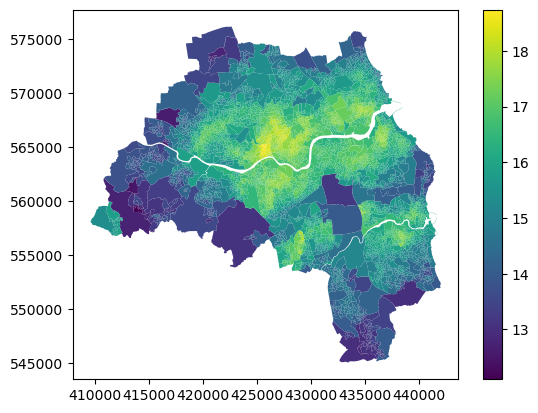

In [87]:
geom.plot(y_pred_lag, legend=True)

Text(0, 0.5, 'Y pred')

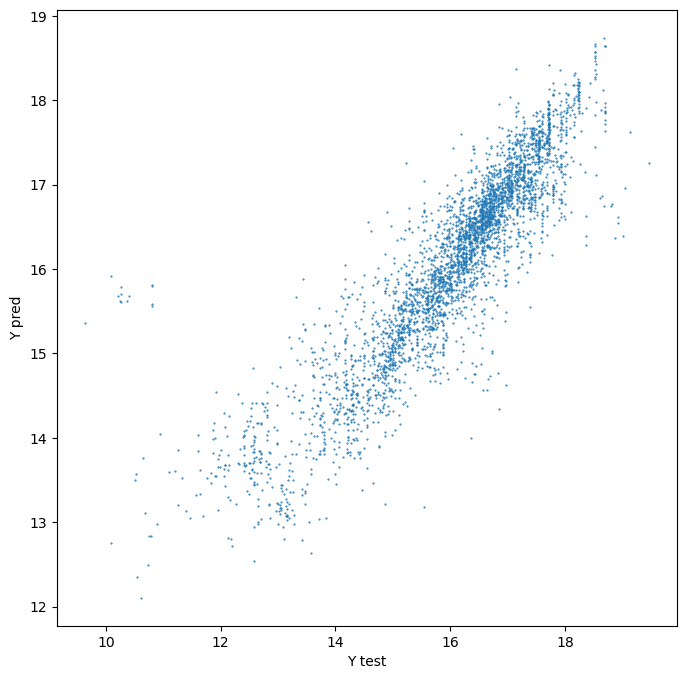

In [91]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.air_quality_index, y_pred_lag, s=.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

In [93]:
from sampling import get_data

In [98]:
vars, jobs, gsp = get_data(df)

for col in vars.columns.copy():
    vars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
        W, vars[col]
    )

pred = est_aq.predict(vars[feature_importance.head(15).index])

<AxesSubplot: >

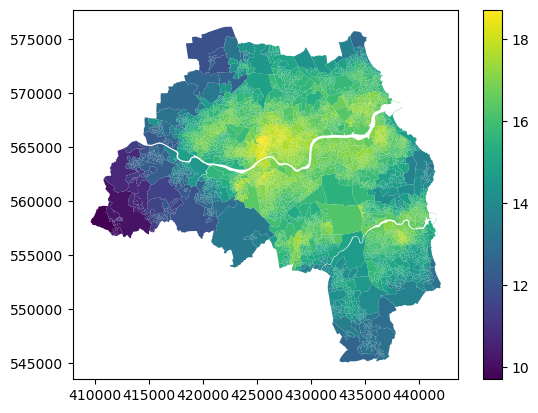

In [99]:
geom.plot(pred, legend=True)

<AxesSubplot: >

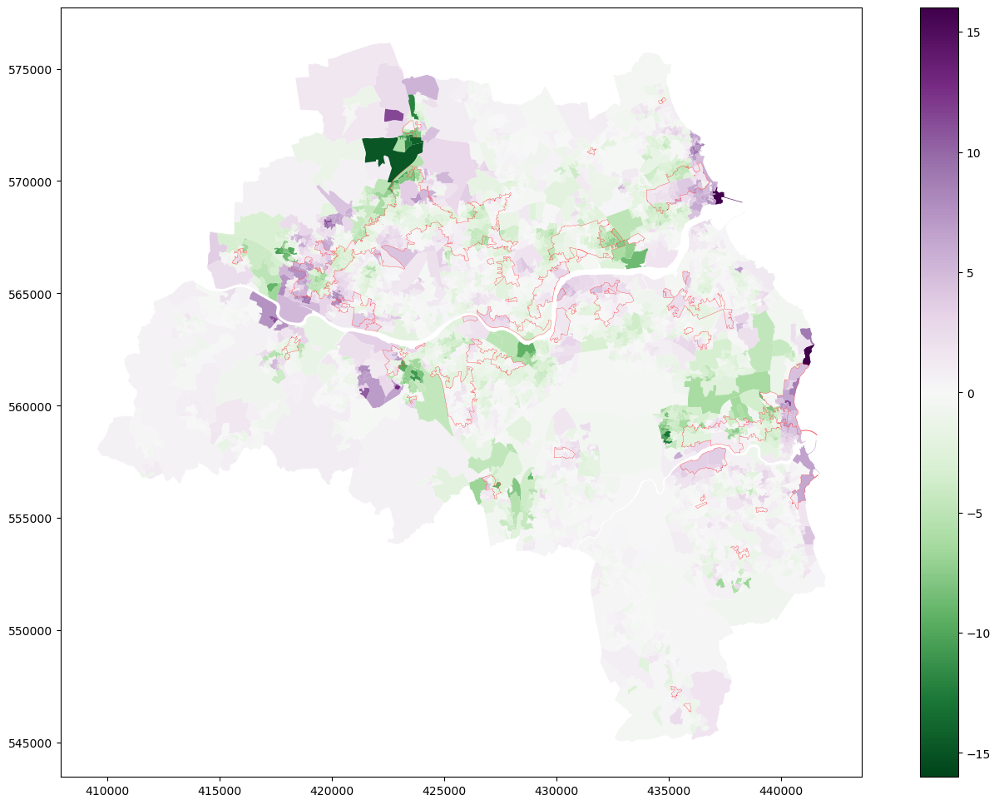

In [101]:
ax = geom.plot((pred - data.air_quality_index.values) / data.air_quality_index.values * 100, legend=True, cmap="PRGn_r", vmin=-16, vmax=16, figsize=(18, 12))
geom[geom.geo_code.isin(dense_res.index)].dissolve().boundary.plot(ax=ax, color="red", linewidth=.2)

In [103]:
df.loc[loc_urb.index, "signature_type"] = 12
df.loc[dense_nei.index, "signature_type"] = 11
df.loc[dense_res.index, "signature_type"] = 10

In [104]:
vars, jobs, gsp = get_data(df)

for col in vars.columns.copy():
    vars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
        W, vars[col]
    )

pred = est_aq.predict(vars[feature_importance.head(15).index])

<AxesSubplot: >

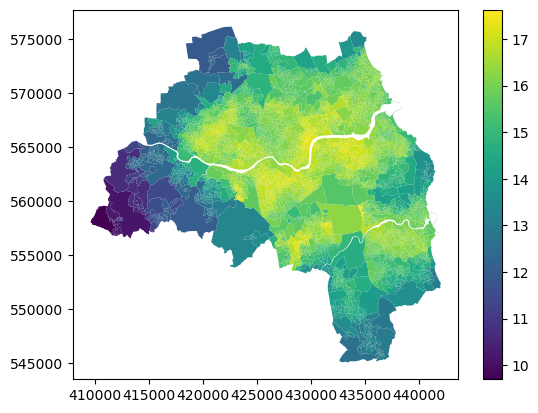

In [105]:
geom.plot(pred, legend=True)

<AxesSubplot: >

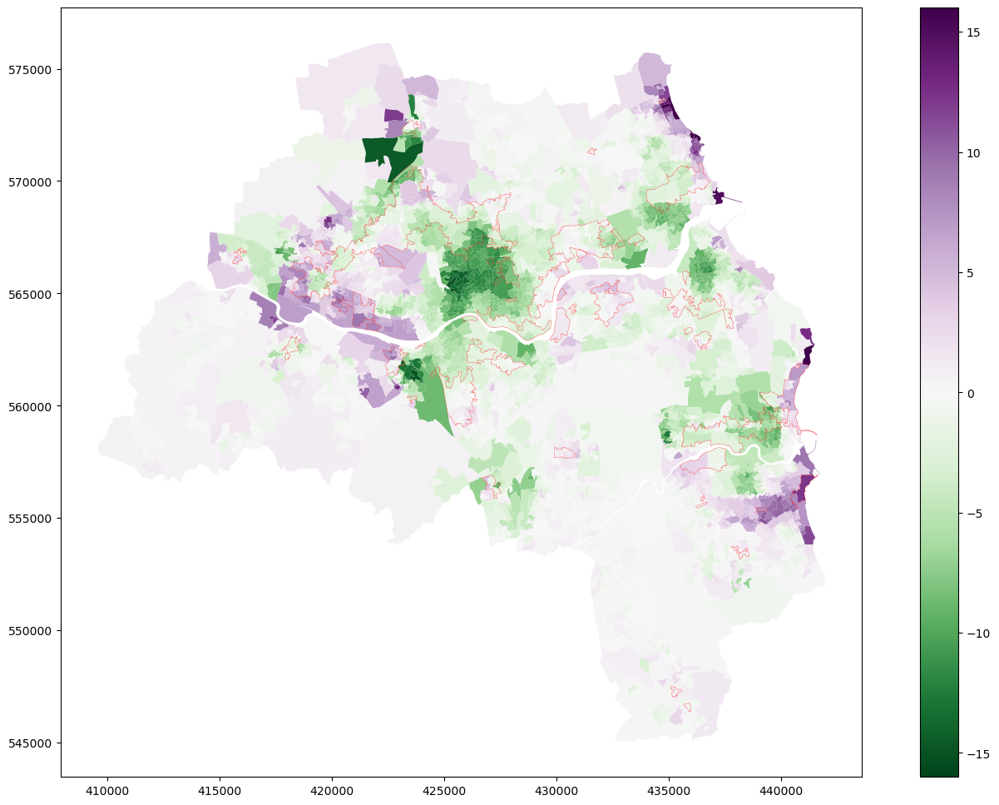

In [106]:
ax = geom.plot((pred - data.air_quality_index.values) / data.air_quality_index.values * 100, legend=True, cmap="PRGn_r", vmin=-16, vmax=16, figsize=(18, 12))
geom[geom.geo_code.isin(dense_res.index)].dissolve().boundary.plot(ax=ax, color="red", linewidth=.2)

In [76]:
mask = data.house_price_index.isna()

In [78]:
from sklearn.inspection import permutation_importance

imp_hp = permutation_importance(
    house_price_predictor.model,
    exvars[~mask],
    data.house_price_index[~mask],
    n_repeats=30,
    random_state=0,
)
feature_importance_hp = pd.Series(
    imp_hp["importances_mean"],
    index=exvars.columns,
    name="permutation_importance",
).sort_values(ascending=False)

In [80]:
feature_importance_hp.head(40)

misCel                                                                            0.066005
sscERI_lag                                                                        0.060827
ssbCCo                                                                            0.048775
sdsSPO_lag                                                                        0.046336
lcnClo                                                                            0.037861
K, L, M, N. Financial, real estate, professional and administrative activities    0.031930
Land cover [Continuous urban fabric]_lag                                          0.031501
ssbSqu                                                                            0.030371
Land cover [Industrial or commercial units]_lag                                   0.027046
linPDE                                                                            0.025931
sicCAR                                                                            0.023793

In [107]:
cells =  gpd.read_parquet(f"{data_folder}/raw/urban_morpho/cells_26.pq")

In [108]:
cells

,hindex,tessellation,buildings,sdbAre,sdbPer,sdbCoA,ssbCCo,ssbCor,ssbSqu,ssbERI,...,ltcRea,ltcAre,ldeAre,ldePer,lseCCo,lseERI,lseCWA,lteOri,lteWNB,lieWCe
0,c026e079867t0005,"POLYGON ((435117.259 545300.665, 435118.608 54...","POLYGON ((435099.720 545242.330, 435103.380 54...",979.31615,277.211468,0.0,0.183733,18.0,1.602821,0.536058,...,61,5.587332e+06,35941.832850,1056.339336,0.234599,0.826846,334.726573,37.654005,0.012307,0.001788
1,c026e079867t0004,"POLYGON ((435156.119 545254.691, 435153.761 54...","POLYGON ((435155.340 545262.750, 435156.970 54...",31.88715,23.171354,0.0,0.576215,4.0,0.061947,1.000048,...,56,4.190615e+06,35941.832850,1056.339336,0.234599,0.826846,334.726573,37.654005,0.012307,0.001788
2,c026e079867t0003,"POLYGON ((435209.412 545252.636, 435211.347 54...","POLYGON ((435188.080 545256.450, 435190.490 54...",72.88730,34.544354,0.0,0.608143,4.0,0.027963,0.999959,...,30,3.759106e+06,35941.832850,1056.339336,0.234599,0.826846,334.726573,37.654005,0.012307,0.001788
3,c026e079867t0002,"POLYGON ((435261.731 545266.219, 435261.794 54...","POLYGON ((435220.270 545262.350, 435221.810 54...",310.25560,90.937931,0.0,0.271272,4.0,0.865288,0.999452,...,27,2.325248e+06,35941.832850,1056.339336,0.234599,0.826846,334.726573,37.654005,0.012307,0.001788
4,c026e079867t0001,"POLYGON ((435246.966 545268.660, 435245.541 54...","POLYGON ((435242.790 545282.250, 435245.270 54...",141.62515,47.703296,0.0,0.631090,4.0,0.032209,1.000003,...,63,5.159064e+06,35941.832850,1056.339336,0.234599,0.826846,334.726573,37.654005,0.012307,0.001788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162328,c026e071903t0000,"POLYGON ((434424.240 574887.450, 434364.690 57...",None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,45,2.364475e+06,3938.194100,343.083707,0.216647,1.016006,112.262298,9.813836,0.020403,0.006877
162329,c026e539773t0000,"POLYGON ((435060.336 575035.007, 435070.530 57...",None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,56,1.286674e+06,852.930797,234.184264,0.081505,0.846780,118.246800,5.246675,0.008540,0.000081
162330,c026e539774t0000,"POLYGON ((435060.336 575035.007, 435059.230 57...",None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,25,1.198482e+06,1341.183189,331.208290,0.063335,0.774948,176.947363,17.039186,0.012077,0.000012
162331,c026e068796t0000,"POLYGON ((420492.740 575254.000, 420499.420 57...",None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,57,7.900343e+06,64305.785750,1441.960846,0.206389,0.849537,490.275776,1.593487,0.004855,0.000940
